# An Investigation Into The Variables That Make a Fighter Successful In The Ultimate Fighting Championship
#### Research Questions 1: Can infight statistics and a fighters physical attributes be used to define *styles* and what is the difference in win rate of each style?
#### Research Question 2: What are the important physical attribute and skill differences between fighters when attempting to predict the outcome of a fight? 
 <hr /> 
 Matthew Galloway PRD1 A 2019/20
 <hr /> 
 
##### [1.0 Importing and Cleaning](#Clean)
###### &nbsp;&nbsp;&nbsp;&nbsp; [1.1 Dataset 1: Infight Data: Identifying Data Quality Issues & Removing Non Binary Outcomes](#quality) 
###### &nbsp;&nbsp;&nbsp;&nbsp; [1.2 Dataset 1: Infight Data: Cleaning](#Cleaning)
###### &nbsp;&nbsp;&nbsp;&nbsp; [1.3 Dataset 2: WebScraping: Fighter level Data](#Scrape)
###### &nbsp;&nbsp;&nbsp;&nbsp; [1.4 Dataset 2: Fighter Level Data: Cleaning and merging with dataset1](#merge)

##### [2.0 EDA](#EDA)
###### &nbsp;&nbsp;&nbsp;&nbsp; [2.1 Investigation 1: Visualising method of winning](#winby)
###### &nbsp;&nbsp;&nbsp;&nbsp; [2.2 Investigation 2: Visualising training camp](#camp)
###### &nbsp;&nbsp;&nbsp;&nbsp; [2.3 Investigation 3: Visualising Age/Height/Weight ](#AHW)

##### [3.0 Research Questions 1: Clustering to Determine Styles](#Cluster)
###### &nbsp;&nbsp;&nbsp;&nbsp; [3.1 Investigation 4: Correlation Matrix for important numerical variables](#corr)
###### &nbsp;&nbsp;&nbsp;&nbsp; [3.2 Min/Max scaling & Inertia](#min)
###### &nbsp;&nbsp;&nbsp;&nbsp; [3.3 Cluster Visualisation:PCA](#PCA)
###### &nbsp;&nbsp;&nbsp;&nbsp; [3.4 Cluster Visualisation:Parallel Coordinates](#Parallel)
###### &nbsp;&nbsp;&nbsp;&nbsp; [3.5 Average Cluster Win Rate Analysis](#CA)

##### [4.0 Research Question 2: Models and Feature Importance](#model)
######  &nbsp;&nbsp;&nbsp;&nbsp; [4.1 Prediction table creation and feature engineering](#prediction)
######  &nbsp;&nbsp;&nbsp;&nbsp; [4.2 Best Model](#model)
######  &nbsp;&nbsp;&nbsp;&nbsp; [4.3 Variable Importance](#variable)

##### [5.0 Apendix](#apendix)
######  &nbsp;&nbsp;&nbsp;&nbsp; [5.1 Web Scraper](#ws)

### Packages used and information
- plotly library is used throughout this investigation, due to issues with jupyer lab and plotly, results have been imported as images for the assessor.

In [1]:
import pandas as pd
import numpy as np
import codecs
import csv
import datetime
import requests
from io import StringIO
from subprocess import call
import random
import time
import progressbar

import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import gridspec
from matplotlib import rcParams
import plotly.express as px
import plotly
from plotly.offline import plot

%matplotlib inline
from IPython.display import Image
from IPython.display import display

from sklearn import preprocessing
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
import statsmodels.api as sm
from sklearn.metrics import classification_report
from sklearn.tree import export_graphviz
from sklearn import tree

from bs4 import BeautifulSoup
from requests_html import HTMLSession

In [2]:
# markdown word counter taken from https://gist.github.com/brennerswenson/fe6c2411e9373375fcb991688fd2b69a
# with permission from the owner
import io
from IPython.nbformat import current
import re

url = "((http|https)\:\/\/)?[a-zA-Z0-9\.\/\?\:@\-_=#]+\.([a-zA-Z]){2,6}([a-zA-Z0-9\.\&\/\?\:@\-_=#])*"
anchor_tags = "<\s*a[^>]*>(.*?)<\s*/\s*a>"
patterns = [url, anchor_tags, "\[", "\]", "\n", "&nbsp;", "(\d.\d{0,2})"]


# replace filepath with your jupyter notebook
with io.open("PDS_SubmissionNotebook.ipynb", "r", encoding="utf-8") as f:
    nb = current.read(f, "json")

word_count = 0
for cell in nb.worksheets[0].cells:
    if cell.cell_type == "markdown":
        words = cell["source"].replace("#", "").lstrip().split(" ")
        words = " ".join(words)
        for pattern in patterns:
            words = re.sub(pattern, "", words)
        words = words.split(" ")
        word_count += len(words)
word_count = word_count - 286  # the length of your table of contents
print("Notebook word count:")
print(word_count)

/Users/matthewgalloway/opt/anaconda3/lib/python3.7/site-packages/IPython/nbformat.py:13: ShimWarning:

The `IPython.nbformat` package has been deprecated since IPython 4.0. You should import from nbformat instead.

/Users/matthewgalloway/opt/anaconda3/lib/python3.7/site-packages/nbformat/current.py:19: UserWarning:

nbformat.current is deprecated.

- use nbformat for read/write/validate public API
- use nbformat.vX directly to composing notebooks of a particular version




Notebook word count:
1516


### 1.0 Importing and Cleaning Datasets

To effectively model styles both infight statistics (punches/kicks thrown) and fighter statistics (age/height/weight) were required. Dataset 1 is the infight statistics taken from Kaggle.com, dataset 2 was aquired by modifying a web scrapping tool adapted from one found on github (appendix for details) with minor changes made to make it python 3 compatable and select the correct HTML fields from the website.
<a id="Clean"></a>

### 1.1 Dataset 1: Infight Data: Identifying Data Quality Issues & Removing Non Binary Outcomes
<a id="Quality"></a>

In [4]:
master_df = pd.read_csv(
    "/Users/matthewgalloway/Documents/Principles_Data_Science/Data/raw_total_fight_data.csv", sep=";"
)
master_df.head()

,R_fighter,B_fighter,R_KD,B_KD,R_SIG_STR.,B_SIG_STR.,R_SIG_STR_pct,B_SIG_STR_pct,R_TOTAL_STR.,B_TOTAL_STR.,...,B_GROUND,win_by,last_round,last_round_time,Format,Referee,date,location,Fight_type,Winner
0,Henry Cejudo,Marlon Moraes,0,0,90 of 171,57 of 119,52%,47%,99 of 182,59 of 121,...,1 of 1,KO/TKO,3,4:51,5 Rnd (5-5-5-5-5),Marc Goddard,"June 08, 2019","Chicago, Illinois, USA",UFC Bantamweight Title Bout,Henry Cejudo
1,Valentina Shevchenko,Jessica Eye,1,0,8 of 11,2 of 12,72%,16%,37 of 40,42 of 52,...,0 of 0,KO/TKO,2,0:26,5 Rnd (5-5-5-5-5),Robert Madrigal,"June 08, 2019","Chicago, Illinois, USA",UFC Women's Flyweight Title Bout,Valentina Shevchenko
2,Tony Ferguson,Donald Cerrone,0,0,104 of 200,68 of 185,52%,36%,104 of 200,68 of 185,...,0 of 0,TKO - Doctor's Stoppage,2,5:00,3 Rnd (5-5-5),Dan Miragliotta,"June 08, 2019","Chicago, Illinois, USA",Lightweight Bout,Tony Ferguson
3,Jimmie Rivera,Petr Yan,0,2,73 of 192,56 of 189,38%,29%,76 of 195,58 of 192,...,4 of 10,Decision - Unanimous,3,5:00,3 Rnd (5-5-5),Kevin MacDonald,"June 08, 2019","Chicago, Illinois, USA",Bantamweight Bout,Petr Yan
4,Tai Tuivasa,Blagoy Ivanov,0,1,64 of 144,73 of 123,44%,59%,66 of 146,81 of 131,...,6 of 6,Decision - Unanimous,3,5:00,3 Rnd (5-5-5),Dan Miragliotta,"June 08, 2019","Chicago, Illinois, USA",Heavyweight Bout,Blagoy Ivanov


- The table shows infight statistics, with a favourite fighter (R_fighter) and an underdog (B_fighter).
- there are 18 text columns that would be better represented as numerical e.g. R_SIG_STR. columns shows "90 of 171". This shows 90 significant strikes  landed out of 171 thrown
- information in some columns is duplicated i.e R_SIG_STR_pct this information is contained with R_SIG_STR
- infight statistics show a match i.e two fighters per row
- to be able to visualise attributes vs outcome its prefered to have one fighter per row
- this requires a splitting of the dataframe maintaing statistics that apply to both i.e fight time, but splitting statitics that apply to each fighter i.e punches thrown

In [5]:
def df_column_splitter(mydataframe):
    #   Splits out columns containing strings in to two numerical columns
    #   removes duplicate columns
    drop_list = []
    cleaning_list = [
        "R_SIG_STR.",
        "B_SIG_STR.",
        "R_TOTAL_STR.",
        "B_TOTAL_STR.",
        "R_TD",
        "B_TD",
        "R_HEAD",
        "B_HEAD",
        "R_BODY",
        "B_BODY",
        "R_LEG",
        "B_LEG",
        "R_DISTANCE",
        "B_DISTANCE",
        "R_CLINCH",
        "B_CLINCH",
        "R_GROUND",
        "B_GROUND",
    ]
    for column in cleaning_list:
        mydataframe[[column + "_attempted", column + "_total"]] = (
            mydataframe[column].str.split(" of ", n=1, expand=True).astype(int)
        )
    mydataframe.drop(cleaning_list, axis=1, inplace=True)

    duplicate_list = list(mydataframe.columns[4:8])
    mydataframe.drop(duplicate_list, axis=1, inplace=True)

    return mydataframe


def split_df(mydataframe):
    #   changes dataframe from 2 fighters per row to one fighter
    #   retains statistics that apply to both such as time of fight and outcome, but seperates fighter specific statistics like punches thrown
    red_fighter = [col for col in mydataframe if col.startswith("R_")]
    blue_fighter = [col for col in mydataframe if col.startswith("B_")]
    match_cols = [
        "last_round",
        "last_round_time",
        "Format",
        "Referee",
        "date",
        "location",
        "Fight_type",
        "Winner",
        "win_by",
    ]
    skills_cols = [word[2:] for word in red_fighter]
    skills_cols += match_cols
    red_cols_dic = dict(zip(red_fighter + match_cols, skills_cols))
    blue_cols_dic = dict(zip(blue_fighter + match_cols, skills_cols))

    split_df = (
        mydataframe[red_fighter + match_cols]
        .rename(columns=red_cols_dic)
        .append(mydataframe[blue_fighter + match_cols].rename(columns=blue_cols_dic))
    )

    split_df["outcome"] = np.where(split_df.Winner == split_df.fighter, 1, 0)
    split_df.drop("Winner", axis=1, inplace=True)
    split_df.reset_index(inplace=True)
    split_df.rename(columns={"index": "link"}, inplace=True)
    return split_df

### 1.1 Dataset 1: Identifying Missing Values Non Binary outcomes
<a id="Missing"></a>

In [6]:
master_df.isnull().sum()[master_df.isnull().sum() != 0]

Referee    23
Winner     83
dtype: int64

- cannot have null values in our winner column as its funamental to analysis, will need to remove
- referee columns is irrelevant for analysis, can drop

In [7]:
master_df.Format.value_counts()

3 Rnd (5-5-5)           4502
5 Rnd (5-5-5-5-5)        423
1 Rnd + OT (12-3)         79
No Time Limit             37
3 Rnd + OT (5-5-5-5)      22
1 Rnd + 2OT (15-3-3)      20
1 Rnd (20)                20
2 Rnd (5-5)               11
1 Rnd (15)                 8
1 Rnd (10)                 6
1 Rnd (12)                 4
1 Rnd + OT (30-5)          3
1 Rnd + OT (15-3)          2
1 Rnd (18)                 2
1 Rnd + OT (27-3)          1
1 Rnd (30)                 1
1 Rnd + OT (31-5)          1
1 Rnd + OT (30-3)          1
1 Rnd + 2OT (24-3-3)       1
Name: Format, dtype: int64

- All number of rounds other than 3 or 5 rounds are old statistically insignifcant fight formats and so will be dropped
- other data quality issues include: splitting and converting string columns to numerical for miniutes fought and reducing overlapping win_type methods using a dictionary

In [8]:
def df_column_cleaner(mydataframe):
    # standardises win type
    # fixes data quality issues with fight format
    # converts relevant fields to date time
    win_type = {
        "Decision - Unanimous": "Decision",
        "Decision - Split": "Decision",
        "TKO - Doctor's Stoppage": "KO/TKO",
        "Decision - Majority": "Decision",
        "Overturned": "DQ",
        "Could Not Continue": "KO/TKO",
    }
    mydataframe.Format = mydataframe.Format.apply(lambda x: x[0])
    mydataframe.Format.replace("N", 6, inplace=True)
    mydataframe = mydataframe[~(mydataframe.Format.isin(["1", "2", 6]))]
    mydataframe = mydataframe[~(mydataframe.Winner.isnull())]
    mydataframe["last_round_time"] = mydataframe["last_round_time"].str.replace(
        ":", "."
    )
    mydataframe.win_by.replace(win_type, inplace=True)
    return mydataframe

### 1.2 Dataset 1: Infight Data: Cleaning
<a id="Cleaning"></a>

In [9]:
clean_df = master_df.copy(deep=True)
clean_df = df_column_splitter(clean_df)
clean_df = df_column_cleaner(clean_df)
clean_df = split_df(clean_df)

### 1.3 Dataset 2: Fighter Data: Web Scraping
<a id="Scrape"></a>

In [3]:
# web scraper adapted from github, full reference in appendix
scraper = Scraper()
out_file = open('sherdog-fighters.csv', 'wb')
csv_file = UnicodeWriter(out_file)

headers = ['ID', 'Name', 'Date of Birth', 'Weight (KG)', 'Height (CM)', 'Locality', 'Nationality', 'Association', 'Wins', 'Losses', 'Draws', 'Last Fight']
csv_file.writerow(headers)
x = 1
while True:
    try:
        fighter = scraper.scrape_fighter(x)
    except KeyboardInterrupt:
        break
    except AttributeError:
        print('attribute error')
        x += 1
    else:
        x += 1
        row = [
            fighter['id'],
            fighter['name'],
            fighter['birth_date'],
            fighter['weight_kg'],
            fighter['height_cm'],
            fighter['locality'],
            fighter['nationality'],
            fighter['camp_team'],
            fighter['wins'],
            fighter['losses'],
            fighter['draws'],
            fighter['last_fight'],
        ]
        row = [str(c) for c in row]
        csv_file.writerow(row)
out_file.close()

### 1.4 Dataset 2: Cleaning and Merging with dataset 1
<a id="merge"></a>

In [ ]:
fighter_details = pd.read_excel(
    "/Users/matthewgalloway/Documents/Principles_Data_Science/Data/ds2final.xlsm",
    sheets="ds2final")
important_cols = [
    "Name",
    "Date of Birth",
    "Weight (KG)",
    "Height (CM)",
    "Nationality",
    "Association",
]

In [16]:
vis_df = clean_df.merge(
    fighter_details[important_cols], how="left", left_on="fighter", right_on="Name"
)

### 2.0 EDA Part 1 
<a id="EDA"></a>

### 2.1 EDA 1: Visualising method of winning over time
<a id="winby"></a>
- Method by which a fighter wins a fight gives a crude approximation of style
- seeing how these change over time gives insight in which styles fighters are using 

In [590]:
def plot_win_time(mydataframe):
    mydataframe = pd.DataFrame(
        mydataframe[["date", "win_by"]].groupby(["date", "win_by"]).win_by.count()
    )
    mydataframe.columns = ["count_wb"]
    mydataframe.reset_index(inplace=True)
    mydataframe.set_index("date", inplace=True)
    mydataframe = pd.DataFrame(
        mydataframe.groupby(by=[mydataframe.index.year, "win_by"]).count_wb.sum()
    )
    mydataframe.reset_index(inplace=True)
    results = px.line(
        mydataframe,
        x="date",
        y="count_wb",
        color="win_by",
        line_group="win_by",
        hover_name="win_by",
    )
    plot(results)
    Image("win_by.png", width=1500, height=20)

<IPython.core.display.Javascript object>

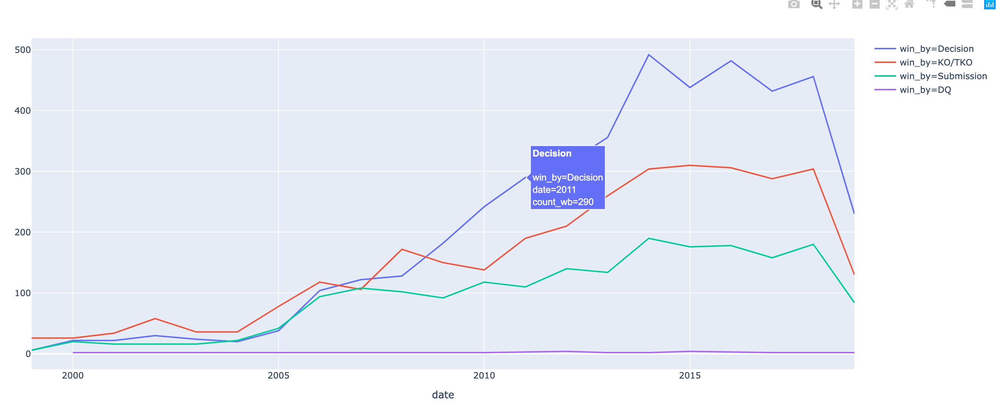

In [522]:
plot_win_time(vis_df)

- as the UFC has matured clear distinctions between finishing methods have resolved
- The majority of fights are finished by refere decision indicating styles favouring endurance over those that attempt to knock someone out are likely to be successful

### 2.1.1 EDA 1.1: Visualising method of winning by weight class
<a id="winby"></a>

- style are very likely to be determined by physical attributes of a fighter
- weight classes are an approximation for fighter attributes (as they standardise a minimum weight) so understanding how method of finishing changes by weight class give an approximation of how styles are likely to change

In [17]:
def weight_class_extractor(wc_series):
    #       returns specific weight class based on a string
    if "Lightweight" in wc_series:
        return "Lightweight"
    if "Welterweight" in wc_series:
        return "Welterweight"
    if "Middleweight" in wc_series:
        return "Middleweight"
    if "Heavyweight" in wc_series:
        return "Heavyweight"
    if "Bantamweight" in wc_series:
        return "Bantamweight"
    if "Strawweight" in wc_series:
        return "Strawweight"
    if "Catch" in wc_series:
        return "Catch"
    if "Featherweight" in wc_series:
        return "Featherweight"
    if "Open" in wc_series:
        return "Open"
    if "Flyweight" in wc_series:
        return "Flyweight"


def order_weight_class(mydataframe):
    #   applys an order to weight classes
    weight_order = [
        "Heavyweight",
        "Middleweight",
        "Welterweight",
        "Lightweight",
        "Featherweight",
        "Bantamweight",
        "Flyweight",
        "Strawweight",
        "Open",
        "Catch",
    ]
    mydataframe.weight_class = pd.Categorical(mydataframe.weight_class, weight_order)


def plot_weight_class_win(mydataframe):
    #   plots weight classes by win method
    not_open = mydataframe.weight_class != "Open"
    not_catch = mydataframe.weight_class != "Catch"
    mydataframe = pd.DataFrame(
        mydataframe.loc[(not_open & not_catch), ["weight_class", "win_by", "fighter"]]
        .groupby(["weight_class", "win_by"])
        .fighter.count()
    )
    mydataframe.reset_index(inplace=True)
    mydataframe.rename({"fighter": "win_count"}, axis=1, inplace=1)
    mydataframe["win_perc"] = mydataframe.win_count.div(
        mydataframe.groupby(["weight_class"]).win_count.transform(sum)
    )
    fig, ax = plt.subplots(figsize=(20, 10))
    plt.title("Method of winning by weight class")
    sns.catplot(
        x="win_by",
        y="win_perc",
        hue="weight_class",
        data=plot2[plot2.win_by != "DQ"],
        kind="bar",
        ax=ax,
    )
    plt.close(2)

In [9]:
vis_df['weight_class']= vis_df.Fight_type.apply(weight_class_extractor)
order_weight_class(vis_df)

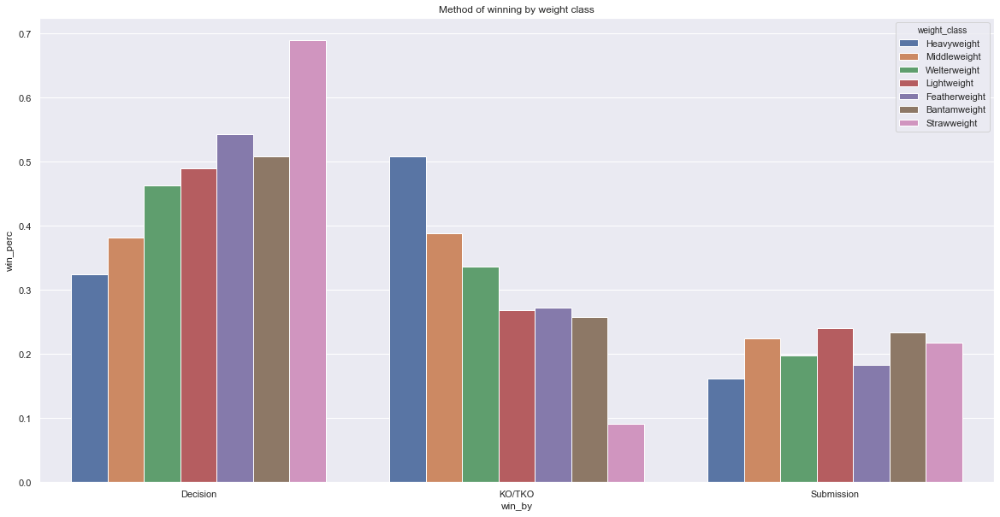

In [2280]:
plot_weight_class_win(vis_df)

- the wins by knock out and wins by decsion are in almost perfect order and inverse order respectivly of weight class
- the heavier a fighter is the more likely he is to have a style with knockouts as a feature and the less likely he is to go the distance of a fights and it decided by decision

###   2.2 Investigation 2: Distribution of Physical Attributes Age/Height/Weight
<a id="AHW"></a>

In [18]:
def extract_age(mydataframe):
    mydataframe["Date of Birth"].fillna("0", inplace=True)
    mydataframe["Date of Birth"] = pd.to_datetime(
        mydataframe["Date of Birth"], errors="coerce"
    )
    mydataframe["date"] = pd.to_datetime(mydataframe["date"], errors="coerce")
    mydataframe["Age"] = (
        mydataframe["date"].dt.year - mydataframe["Date of Birth"].dt.year
    )
    return mydataframe

In [608]:
def physical_feature_plotter(mydataframe):
    for feature in ["Weight (KG)", "Height (CM)", "Age"]:
        feature_filter = mydataframe[feature] != 0
        fig = px.box(
            mydataframe[feature_filter],
            x="weight_class",
            y=feature,
            color="outcome",
            notched=True,  # used notched shape
            title=feature + " Distribution Within a Weight Class",
        )
        plot(fig)

<IPython.core.display.Javascript object>

In [21]:
vis_df=extract_age(vis_df)
physical_feature_plotter(vis_df)

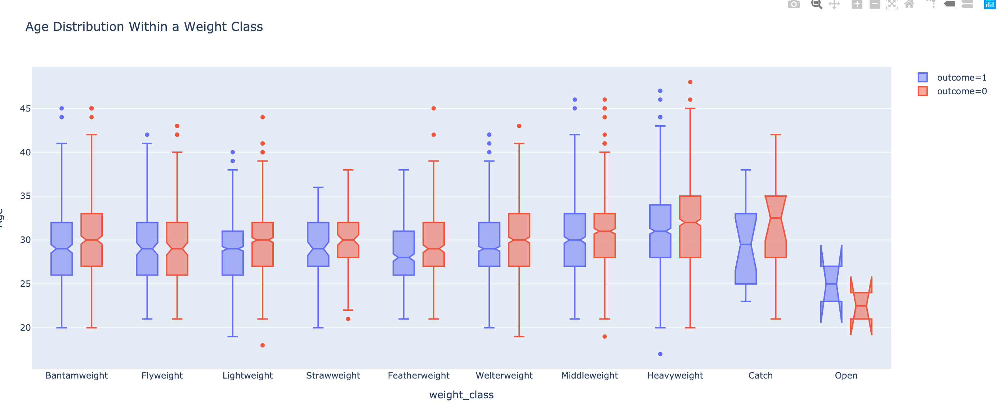

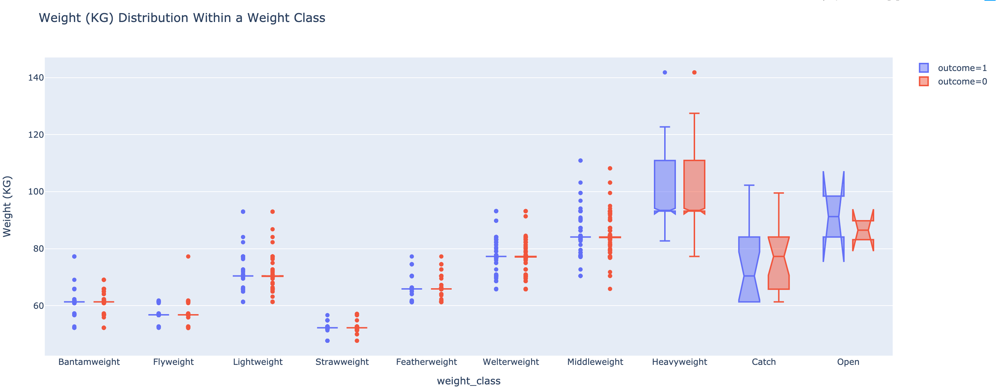

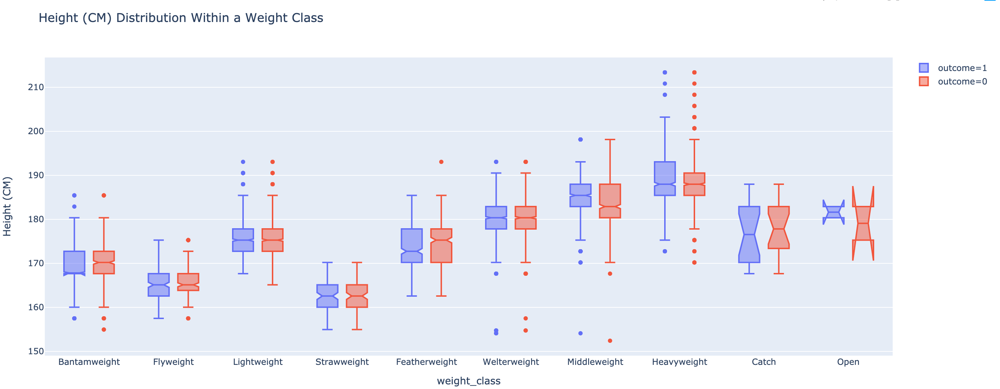

In [2338]:
age = Image(filename='Age.png') 
weight = Image(filename='Weight.png') 
height = Image(filename='Height.png') 
display(age,weight,height)

- older fighter seem to be more likely to loose. Interesting as you go up weight classes average fighter age increases.
- weight class has very strict distribution as many fighters weights are listed as they weight they compete at. Data limitation (see report for details) as this is not a true representation of a fighters weight. 
- height seems to be the same accross winners and loosers, contrary to the hypothesis which expected height would play a big role due to a fighters ability to control distance when striking. i.e hit an opponent but not get hit back as they are out of reach

### 2.3 Investigation 3: Visualising win rate by club
<a id="club"></a>
- A final interesting consideration for style is club at which a player trains at
- a club is likely to have coaches that specialise in certain styles due to coaching staff, but also fighters will be influence by the styles of other fighters at the club 

In [594]:
def plot_clubs(mydataframe):
    winners = mydataframe.outcome == 1
    mydataframe = pd.DataFrame(
        mydataframe.loc[winners].groupby(["date", "Association"]).outcome.sum()
    )
    mydataframe.reset_index(inplace=True)
    mydataframe.set_index("date", inplace=True)
    mydataframe = pd.DataFrame(
        mydataframe.groupby(by=[mydataframe.index.year, "Association"]).outcome.sum()
    )
    mydataframe = mydataframe.reset_index().pivot(index="date", columns="Association")
    mydataframe = mydataframe.cumsum()
    mydataframe.reset_index(inplace=True)
    mydataframe = mydataframe.melt(id_vars=["date"])
    results = px.line(
        viz3[viz3.value > 5],
        x="date",
        y="value",
        color="Association",
        line_group="Association",
        hover_name="Association",
    )
    plot(results)

<IPython.core.display.Javascript object>

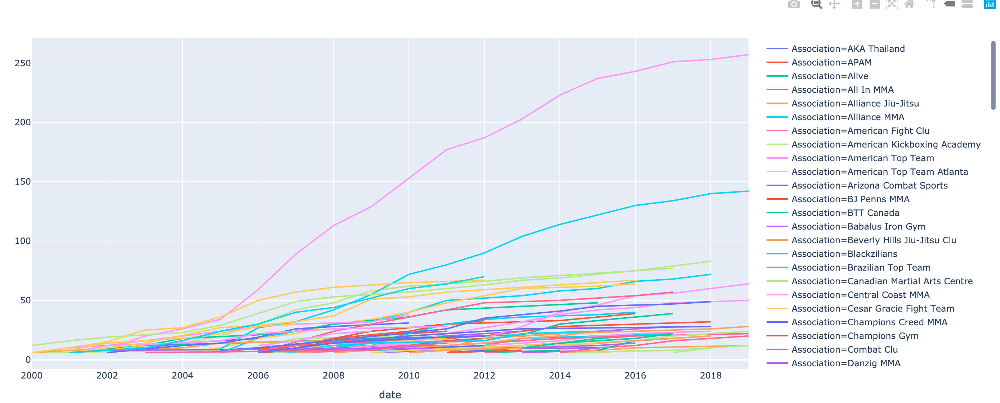

In [1969]:
plot_clubs(vis_df)
Image("clubs.png", width=2000, height=20)

- some clubs appear to be very dominant at producing winning fighters, future works examining styles of these club could provide insight in to why 

### 3.0 Research Questions 1 Investigation: Clustering to Determine Styles from infight statistics and fighter attributes
<a id="Cluster"></a>

### 3.1 Investigation 5: Correlation Matrix for important numerical variables
<a id="corr"></a>

In [19]:
cluster_variables = [
    "SIG_STR._total",
    "KD",
    "SUB_ATT",
    "REV",
    "TD_total",
    "GROUND_total",
    "last_round",
    "Weight (KG)",
    "Height (CM)",
    "Age",
]


def corr_plot(dataframe, grouping):
    # variations of correlation maps used throughout the notebook
    if grouping == 1:
        cor = dataframe.corr()
    elif grouping == 2:
        #         dataframe.drop([col for col in clean_df if col.endswith("_attempted")],axis=1,inplace=True)
        group = [
            "SIG_STR._total",
            "fighter",
            "KD",
            "SUB_ATT",
            "REV",
            "TD_total",
            "GROUND_total",
            "last_round",
            "last_round_time",
            "Format",
            "Referee",
            "date",
            "location",
            "Fight_type",
            "Weight (KG)",
            "Height (CM)",
            "Age",
            "outcome",
        ]
        dataframe = dataframe[group]
    elif grouping == 3:
        dataframe.drop(
            [col for col in dataframe.columns if "_attempted" in col],
            axis=1,
            inplace=True,
        )
    elif grouping == 4:
        dataframe = dataframe[
            [
                "Striking_dif",
                "Power_dif",
                "Grappling_dif",
                "Wrestling_dif",
                "Striking_wr_dif",
                "Wrestling_wr_dif",
                "Grappling_wr_dif",
                "Weight (KG)_dif",
                "Height (CM)_dif",
                "Age_dif",
                "No_fights_sum_dif",
                "outcome",
            ]
        ]
    elif grouping == 5:
        dataframe = dataframe[
            [
                "SIG_STR._total",
                "TOTAL_STR._total",
                "HEAD_total",
                "BODY_total",
                "LEG_total",
                "DISTANCE_total",
                "CLINCH_total",
            ]
        ]
    cor = dataframe.corr()
    rcParams.update({"figure.autolayout": True})
    fig, ax = plt.subplots(figsize=(20, 10))
    sns.heatmap(cor, annot=True, linecolor="white", linewidths=1)
    b, t = plt.ylim()
    b += 0.5
    t -= 0.5
    plt.ylim(b, t)
    plt.show()


def min_max_scaling(mydataframe):
    # min max scaling for a dataframe
    min_max_scaler = preprocessing.MinMaxScaler()
    mydataframe[cluster_variables] = min_max_scaler.fit_transform(
        mydataframe[cluster_variables]
    )
    return mydataframe


def plot_inertia(mydataframe, variables):
    # inertia calculation and plot for k means, using K-means ++ to avoid initialisation trap
    if variables == 1:
        mydataframe = mydataframe[cluster_variables].dropna()
    elif variables == 2:
        mydataframe = mydataframe[
            [
                "SIG_STR._total",
                "KD",
                "SUB_ATT",
                "REV",
                "TD_total",
                "GROUND_total",
                "last_round",
            ]
        ].dropna()
    X = mydataframe.values
    inertia = []
    for i in range(1, 15):
        kmeans = KMeans(n_clusters=i, init="k-means++")
        kmeans.fit(X)
        inertia.append(kmeans.inertia_)
    plt.figure(num=None, figsize=(10, 10), dpi=50, facecolor="w", edgecolor="k")
    plt.plot(range(1, 15), inertia)
    plt.xlabel("No Clusters")
    plt.ylabel("Inertia")
    plt.title("Elbow Analysis")

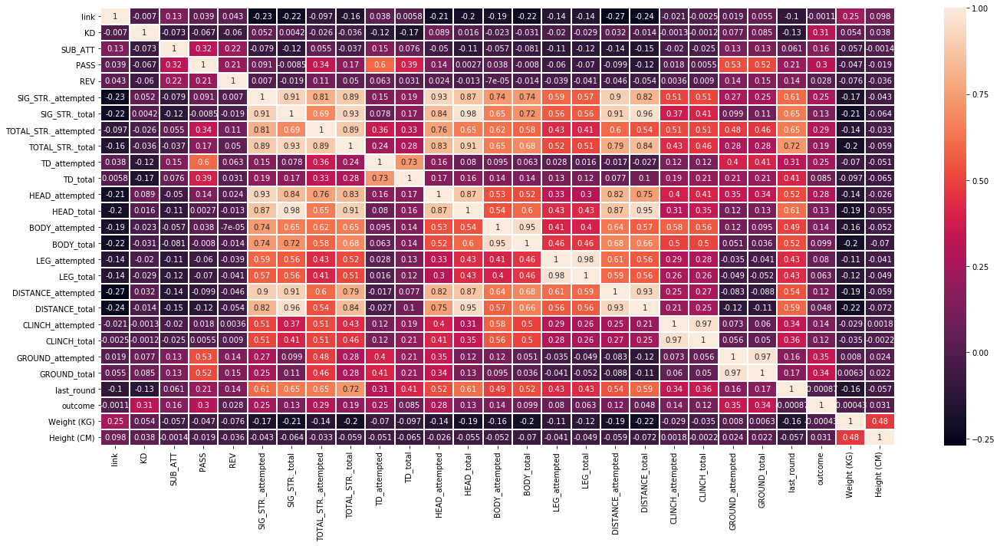

In [241]:
corr_plot(vis_df,1)

- very high levels of correlation which makes sense as we have variables in the format number of significant strike and number of significant strike attempted. These variables are clear representing the same thing so dropped 
- below shows variables with .65  or less correlation, this is noted as especially high but given the large correlations in general for this data set are left in as they were deemed to be distinct using domain knowledge

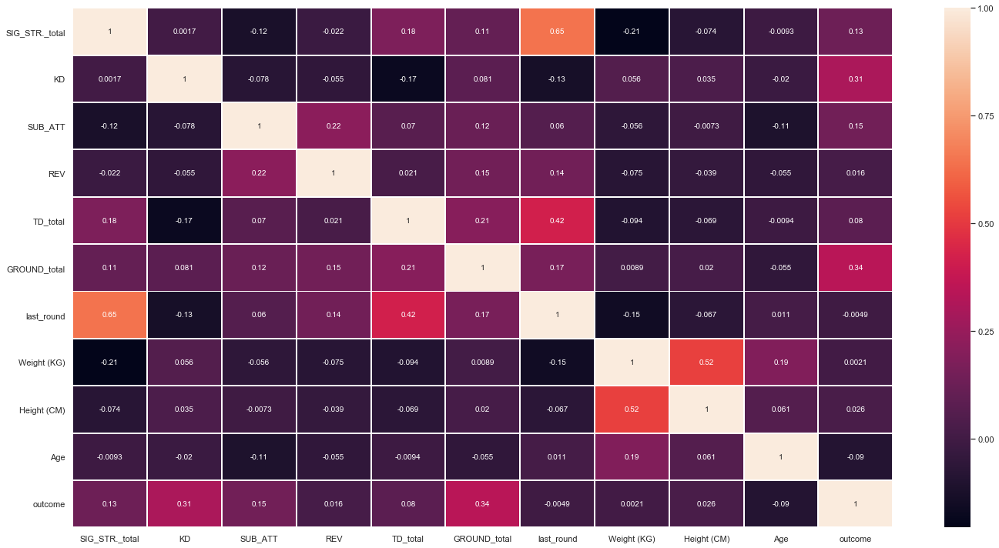

In [2309]:
corr_plot(vis_df,2)

### 3.2 Min/Max scaling and Inertia
<a id="min"></a>

In [2346]:
vis_df[cluster_variables].isnull().sum()[vis_df.isnull().sum()!=0]

Weight (KG)    1435
Height (CM)    1435
Age            1598
dtype: int64

for clustering and further application of ML models removal of null values in the above categories was done

In [22]:
age_nn = vis_df.Age.notnull()
weight_nn=vis_df['Weight (KG)'].notnull()
height_nn=vis_df['Height (CM)'].notnull()
vis_df =vis_df[age_nn &weight_nn&height_nn]
vis_df = min_max_scaling(vis_df)

/Users/matthewgalloway/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:92: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/matthewgalloway/opt/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:494: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



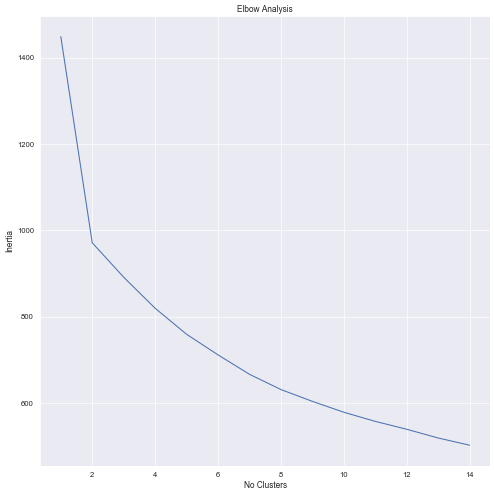

In [2356]:
plot_inertia(vis_df,1)

- inertia evaluated for k means to determine correct number of clusters as a starting point

### 3.4 Cluster Visualisation:PCA
<a id="PCA"></a>

In [600]:
def plot_2D_clusters_pca(mydataframe, cluster_no, variables):
    #%% plots kmeans clusters in two PCA dimensions (code example adapted from that shown in city university visual analytic workshop)
    if variables == 1:
        mydataframe = mydataframe[cluster_variables].dropna()
    elif variables == 2:
        mydataframe = mydataframe[
            [
                "SIG_STR._total",
                "KD",
                "SUB_ATT",
                "REV",
                "TD_total",
                "GROUND_total",
                "last_round",
                "Height (CM)",
            ]
        ].dropna()
    pca = PCA(n_components=2)
    X = mydataframe.values
    pca.fit(X)
    pca_results = pca.transform(X)
    # creating in stance of kmeans
    n_clusters = cluster_no
    kmeans = KMeans(n_clusters=cluster_no, n_init=10, init="k-means++")
    kmeans = kmeans.fit(X)

    # kmeans cluster analysis
    kmeans_predict = kmeans.predict(X)

    # Getting the Centroid values
    kmeans_centroids = kmeans.cluster_centers_
    centroids_pca = pca.transform(kmeans_centroids)

    cluster_colors = {0: "yellow", 1: "green", 2: "blue", 3: "orange", 4: "red"}
    # scatterplot
    plt.figure(figsize=(15, 8))
    plt.xlabel("Principal Component 1")
    plt.ylabel("Principal Component 2")
    plt.title(
        "K Means projected on to two Principal Components + with k = {} clusters".format(
            n_clusters
        )
    )

    label_colors_1 = list(map(cluster_colors.get, kmeans_predict))
    centroid_colors = ["black", "black", "black", "black", "black"]

    plt.scatter(pca_results[:, 0], pca_results[:, 1], alpha=0.2, c=label_colors_1)
    plt.scatter(
        centroids_pca[:, 0],
        centroids_pca[:, 1],
        marker="s",
        edgecolors=centroid_colors,
        linewidth=3,
        facecolors="None",
        s=200,
    )


def plot_3d_clusters_PCA(mydataframe, no_clusters, variables):
    #%% plots kmeans clusters in three PCA

    if variables == 1:
        mydataframe = mydataframe[cluster_variables].dropna()
    elif variables == 2:
        mydataframe = mydataframe[
            [
                "SIG_STR._total",
                "KD",
                "SUB_ATT",
                "REV",
                "TD_total",
                "GROUND_total",
                "last_round",
                "Height (CM)",
            ]
        ].dropna()
    X = mydataframe.values
    pca = PCA(n_components=3)
    pca.fit(X)
    pca_results = pca.transform(X)
    # creating in stance of kmeans
    kmeans = KMeans(n_clusters=no_clusters, n_init=10, init="k-means++")
    kmeans = kmeans.fit(X)

    # kmeans cluster analysis
    kmeans_predict = kmeans.predict(X)

    cluster_colors = {0: "yellow", 1: "green", 2: "blue", 3: "orange", 4: "red"}
    label_colors_1 = list(map(cluster_colors.get, kmeans_predict))

    from mpl_toolkits.mplot3d import Axes3D

    fig = plt.figure(figsize=(15, 8))
    ax = fig.add_subplot(111, projection="3d")
    ax.scatter(
        pca_results[:, 0],
        pca_results[:, 1],
        pca_results[:, 2],
        marker="o",
        c=label_colors_1,
        cmap="plasma",
    )
    ax.set_xlabel("Principle Component 1")
    ax.set_ylabel("Principle Component 2")
    ax.set_zlabel("Principle Component 3")
    plt.title(
        "K Means projected on to 3 Principal Components + with k = {} clusters".format(
            no_clusters
        )
    )


def plot_3d_dbscan(mydataframe, variables):
    #%% plots DBSCAN clusters in three PCA
    if variables == 1:
        mydataframe = mydataframe[cluster_variables].dropna()
    elif variables == 2:
        mydataframe = mydataframe[
            [
                "SIG_STR._total",
                "KD",
                "SUB_ATT",
                "REV",
                "TD_total",
                "GROUND_total",
                "last_round",
                "Height (CM)",
            ]
        ].dropna()
    pca = PCA(n_components=3)
    X = mydataframe.values
    pca.fit(X)
    pca_results = pca.transform(X)

    # cluster the data into five clusters
    dbscan = DBSCAN(eps=0.249, min_samples=20)
    clusters = dbscan.fit_predict(X)
    # plot the cluster assignments
    from mpl_toolkits.mplot3d import Axes3D

    fig = plt.figure(figsize=(15, 8))
    ax = fig.add_subplot(111, projection="3d")
    ax.scatter(
        pca_results[:, 0],
        pca_results[:, 1],
        pca_results[:, 2],
        marker="o",
        c=clusters,
        cmap="plasma",
    )
    ax.set_xlabel("Principle Component 1")
    ax.set_ylabel("Principle Component 2")
    ax.set_zlabel("Principle Component 3")
    plt.title("DBSCAN Identifying 4 clusters")

<IPython.core.display.Javascript object>

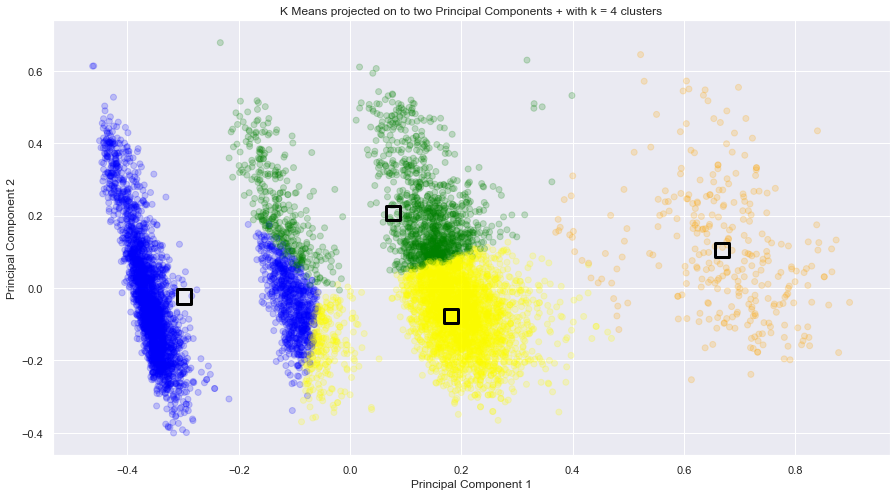

In [2248]:
plot_2D_clusters_pca(vis_df,4,1)

- evaluating clusters in 2 D for Kmeans showed poor resolution of clusters

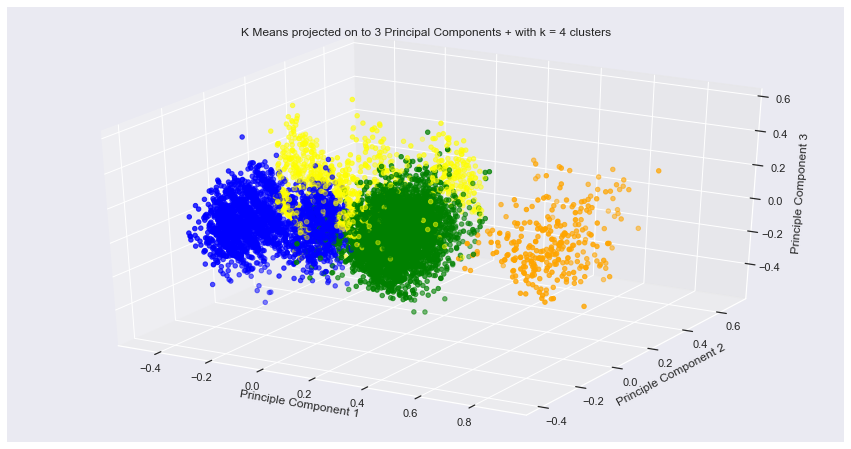

In [2250]:
plot_3d_clusters_PCA(vis_df,4,1)

- evaluating k means in 3 dimensions again showed poor resolution

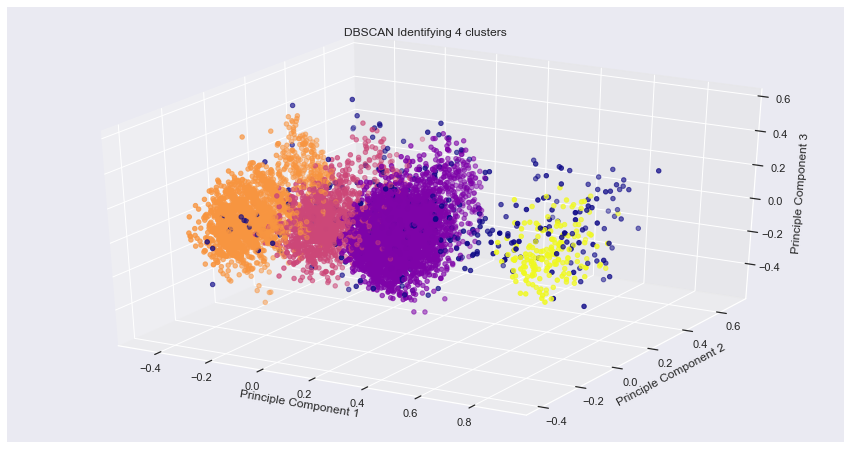

In [2251]:
plot_3d_dbscan(vis_df,1)

- evaluating DBSCAN in 3 principle components showed good resolution althought the noise (dark blue) and the yellow cluster are noted to overlap to some extent. 
- Adjusting epsilon higher caused clusters to form one so noise was accepted 

### 3.5 Average Physical Attributes and Infight Statistics of Clusters using Parallel Coordinates
<a id="Parallel"></a>

In [602]:
def get_kmeans_results(mydataframe, clusters, variables):
    # transforms kmeans results in to averages for each variable to be used for parallel coordinates plot
    if variables == 1:
        results_var = cluster_variables + ["outcome"]
    elif variables == 2:
        results_var = [
            "SIG_STR._total",
            "KD",
            "SUB_ATT",
            "REV",
            "TD_total",
            "GROUND_total",
            "last_round",
            "outcome",
            "Height (CM)",
        ]
    kmean_df = mydataframe[cluster_variables].dropna()
    X = kmean_df.values
    kmeans = KMeans(n_clusters=clusters, init="k-means++")
    cluster_results = kmeans.fit_predict(X)
    kmean_df["cluster"] = cluster_results
    results_table = pd.DataFrame(kmeans.cluster_centers_, columns=kmean_df.columns[:-1])
    kmean_df["outcome"] = mydataframe.loc[
        mydataframe[cluster_variables].dropna().index
    ].outcome
    results_table["win_aver"] = kmean_df.groupby(["cluster"]).outcome.mean()

    results_table["category_size"] = kmean_df.cluster.value_counts().sort_index(axis=0)
    results_table.reset_index(inplace=True)
    results_table.rename(columns={"index": "cluster"}, inplace=True)
    return results_table


def get_dbscan_results(mydataframe, clusters, variables):
    # transforms DBSCAN results in to averages for each variable to be used for parallel coordinates plot
    if variables == 1:
        results_var = cluster_variables + ["outcome"]
    elif variables == 2:
        results_var = [
            "SIG_STR._total",
            "KD",
            "SUB_ATT",
            "REV",
            "TD_total",
            "GROUND_total",
            "last_round",
            "outcome",
            "Height (CM)",
        ]
    dbscan_df = mydataframe[cluster_variables].dropna()
    X = dbscan_df.values
    dbscan = DBSCAN(eps=0.249, min_samples=20)
    cluster_results = dbscan.fit_predict(X)
    dbscan_df["cluster"] = cluster_results
    results_table = pd.DataFrame(
        dbscan_df.groupby(["cluster"]).mean(), columns=dbscan_df.columns[:-1]
    )
    dbscan_df["outcome"] = mydataframe.loc[
        mydataframe[cluster_variables].dropna().index
    ].outcome
    results_table["win_aver"] = dbscan_df.groupby(["cluster"]).outcome.mean()
    results_table["category_size"] = dbscan_df.cluster.value_counts().sort_index(axis=0)
    results_table.reset_index(inplace=True)
    results_table.rename(columns={"index": "cluster"}, inplace=True)

    return (results_table, dbscan_df)


def parallel_plot_results(mytable):
    # Plots a parallel coordinate map
    results = px.parallel_coordinates(
        mytable,
        color="cluster",
        color_continuous_scale=px.colors.diverging.Tealrose,
        color_continuous_midpoint=2,
    )
    plot(results)


#     from IPython.display import Image
#     Image("parallel.png", width=1000, height=20)

<IPython.core.display.Javascript object>

In [2358]:
# results_table = get_kmeans_results(vis_df,4,1)
results_table,dbscan_df = get_dbscan_results(vis_df,4,1)

In [2150]:
reorder_cols= ['cluster','win_aver', 'SIG_STR._total','last_round','KD', 'SUB_ATT', 'REV', 'TD_total',
       'GROUND_total','Height (CM)','Weight (KG)','Age']
parallel_plot_results(results_table)

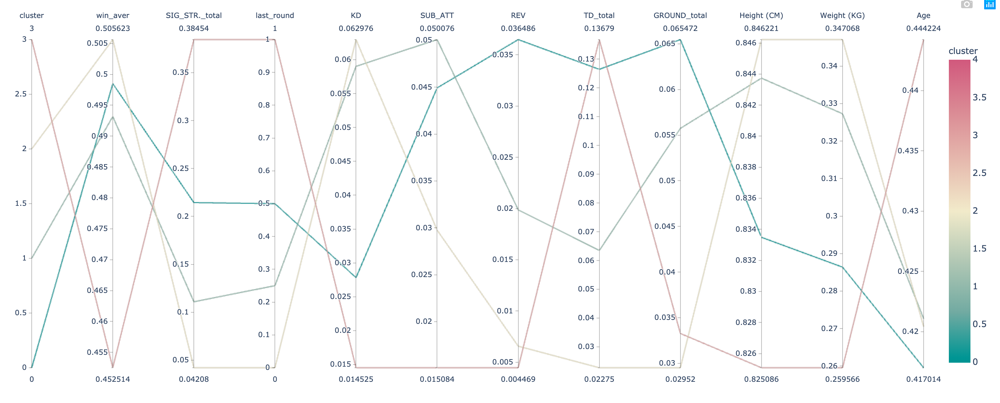

In [1763]:
from IPython.display import Image
Image("parallel.png", width=2000, height=20)

Description of each cluster (extended analysis in report)
#### Cluster 0: Generalists
    - Good striking ability +good ground game
#### Cluster 1:Excessively Offensive
    - Striking athletes that go for a finish often but have poor defenses
#### Cluster 2: Power Athletes
    - high body weight, high knock downs, high win rate, fights finish early
#### Cluster 3: Older Boxer/Wrestlers
    - Large number of takedowns (wrestler), older athletes with lower win ratio

- DBSCAN highlights a unclassifiable cluster it labels -1. Investigation  below vs the next two highest win rate clusters and found it to cluster form the highest winning category by more than 15% and contain the almost all the UFC champions for each weight class

In [ ]:
parallel_plot_results(results_table[reorder_cols])

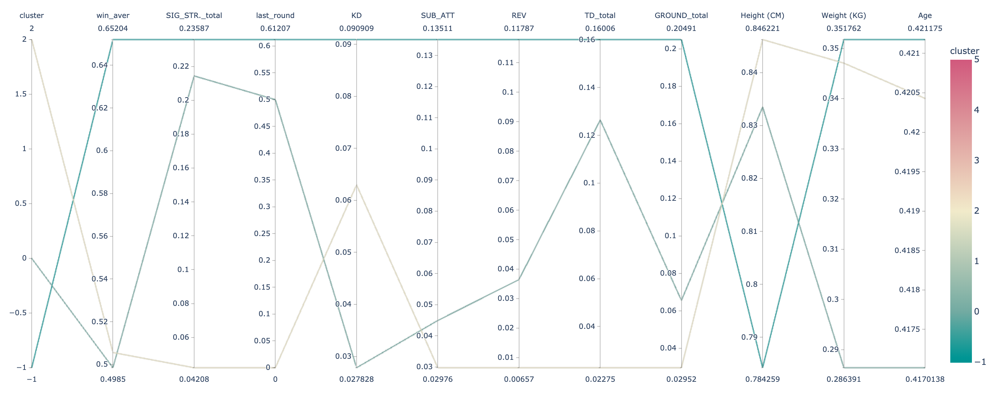

In [1772]:
Image("Champs.png", width=2000, height=20)

In [603]:
def plot_cluster_by_weight_class(mydataframe):
    # plots clusters by weight class
    working = pd.DataFrame(
        mydataframe.groupby(["cluster", "weight_class"]).fighter.count()
    ).reset_index()
    working.columns = ["cluster", "weight_class", "cluster_count"]
    fig, ax = plt.subplots(figsize=(20, 10))
    mask1 = working.weight_class != "Open"
    mask2 = working.weight_class != "Catch"
    working = working[mask1 & mask2]
    plt.title("Cluster distribution by weight class (minus open and catch weight)")
    sns.catplot(
        x="weight_class",
        y="cluster_count",
        hue="cluster",
        data=working,
        kind="bar",
        ax=ax,
    )
    plt.close(2)

<IPython.core.display.Javascript object>

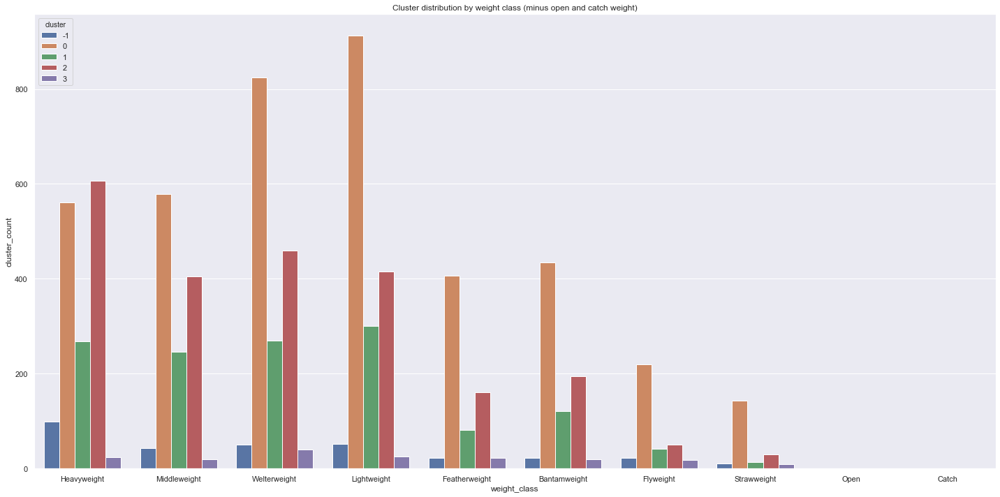

In [2379]:
plot_cluster_by_weight_class(vis_df)

- higher weight classes favour cluster 2 (power cluster)
- gernealists are seen in all weight classes but peak in the middle of the weight class range suggesting they have both striking and submission ability
- lower weight classes have large proportion of clusters with decision finishes vs submission/KO finshes

### 3.6 Cluster Win Rate Analysis
<a id="CA"></a>

In [604]:
def get_cluster_wr(mydataframe, cluster_df):
    # caluclates the win rate for each cluster
    half_columns = mydataframe.shape[0] / 2
    mydataframe.sort_index(inplace=True)
    mydataframe["cluster"] = cluster_df["cluster"]
    mydataframe = mydataframe[["link", "cluster", "outcome"]]
    results_df = mydataframe.loc[0:half_columns]
    results_df.columns = ["link", "r_cluster", "r_outcome"]
    results_df = results_df.merge(
        mydataframe.loc[half_columns:, :], how="inner", on="link"
    )
    r_wins = results_df.r_outcome == 1
    b_wins = results_df.outcome == 1
    col = ["-1", "0", "1", "2", "3"]
    comparison_df = pd.DataFrame(np.zeros((5, 1)), columns=["winrate"], index=col)
    for r_cluster in range(-1, 4):
        mask1 = results_df["r_cluster"] == r_cluster
        mask2 = results_df["cluster"] == r_cluster
        comparison_df.iloc[r_cluster + 1, 0] = np.divide(
            results_df[r_wins & mask1].shape[0] + results_df[b_wins & mask2].shape[0],
            results_df[mask1].shape[0] + results_df[mask2].shape[0],
        )
    comparison_df = comparison_df * 100
    return comparison_df


def plot_cluster_wr(mydataframe):
    # plots winrate for each cluster
    mydataframe = mydataframe.reset_index()
    mydataframe.columns = ["Cluster", "Win Rate/%"]
    mydataframe["Win Rate/%"] = mydataframe["Win Rate/%"].round()
    fig = px.bar(
        mydataframe.round(),
        x="Cluster",
        y="Win Rate/%",
        color="Cluster",
        text="Win Rate/%",
    )
    plot(fig)

<IPython.core.display.Javascript object>

In [2361]:
win_df= get_cluster_wr(vis_df,k_means_df)
plot_cluster_wr(win_df)

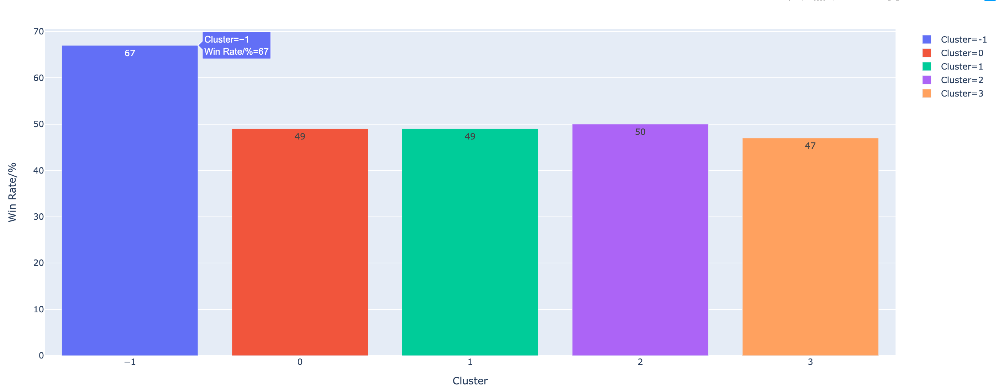

In [2362]:
Image("winrate.png", width=2000, height=20)

- most clusters have a similar win average to one another, the exception is our anomalies class which contains all UFC champions
- clustering was successful in defining skill categories, but not at finding different win rates
- interestingly it was succesful at finding complete outliers to the data set a "champion category", DBSCAN is notes in literature for its anomaly detection ability

### 4.0 Question 2: Feature Engineering and the Creation of Prediction tables
<a id="Q2"></a>
- Dataset previously contained among other fields infight statistics and outcomes, building models on that dataset would be using future information (what happened in a fight) to predict the outcome
- Instead cumulative tables were created which contained a fighters statistics up until the time of the fight to avoid the above problem
- The infight statistics table also contained a favourite 'R_fighter' and underdog 'B_' fighter, which required the tables to be shuffled to avoid any predictive technique simply taking a majority class vote and always pick the favourite
- features were engineered using the knowledge from the previous investigation and domain knowledge to make analysis of skills easier:
- $Experience = Total Fights$
- $Power = \frac{Knockouts}{Total Fight}$ : Represents the knockout power of the fighter

- $Grappling\ Ability = \ Submission \  attempts+ Guard pass + Reversal$ : Represents the grappling skill of the athlete
- $Striking\ Ability = \frac {Head  + Body + Leg \ attempts }{Head  + Body + Leg \ landed}$ : Represents the Striking skill of the athlete
- $Wrestling\ Ability = \frac{Take\  Downs\  Landed}{Take\  Downs \ Attempted}$ : Represents the skill set of wrestling of the fighter

- $Grapling\ Work\ Rate = \frac{grapling\  ability}{Minutes\  fought}$ : Represents the work rate in the skill set of grapling of the fighter
- $Striking\ Work\ Rate = \frac{striking \ ability}{Minutes \ fought}$ : Represents the work rate in the skill set of striking of the fighter
- $Wresting\ Work\ Rate = \frac{wrestling\  ability}{Minutes\  fought}$ : Represents the work rate in the skill set of wrestling of the fighter



In [606]:
cumul_cols = [
    "KD",
    "SUB_ATT",
    "PASS",
    "REV",
    "SIG_STR._attempted",
    "SIG_STR._total",
    "TOTAL_STR._attempted",
    "TOTAL_STR._total",
    "TD_attempted",
    "TD_total",
    "HEAD_attempted",
    "HEAD_total",
    "BODY_attempted",
    "BODY_total",
    "LEG_attempted",
    "LEG_total",
    "DISTANCE_attempted",
    "DISTANCE_total",
    "CLINCH_attempted",
    "CLINCH_total",
    "GROUND_attempted",
    "GROUND_total",
    "win_by_Decision",
    "win_by_KO/TKO",
    "win_by_Submission",
    "mins_fighting",
    "No_fights",
]
fighter_cols = [
    "Weight (KG)",
    "Height (CM)",
    "Nationality",
    "Association",
    "Age",
    "win_by_DQ",
    "KD_sum",
    "SUB_ATT_sum",
    "PASS_sum",
    "REV_sum",
    "SIG_STR._attempted_sum",
    "SIG_STR._total_sum",
    "TOTAL_STR._attempted_sum",
    "TOTAL_STR._total_sum",
    "TD_attempted_sum",
    "TD_total_sum",
    "HEAD_attempted_sum",
    "HEAD_total_sum",
    "BODY_attempted_sum",
    "BODY_total_sum",
    "LEG_attempted_sum",
    "LEG_total_sum",
    "DISTANCE_attempted_sum",
    "DISTANCE_total_sum",
    "CLINCH_attempted_sum",
    "CLINCH_total_sum",
    "GROUND_attempted_sum",
    "GROUND_total_sum",
    "win_by_Decision_sum",
    "win_by_KO/TKO_sum",
    "win_by_Submission_sum",
    "mins_fighting_sum",
    "No_fights_sum",
]
both = [
    "link",
    "fighter",
    "last_round",
    "last_round_time",
    "Format",
    "date",
    "outcome",
    "weight_class",
]
final = [
    "R_Striking",
    "R_Power",
    "R_Grappling",
    "R_Wrestling",
    "R_Striking_wr",
    "R_Wrestling_wr",
    "R_Grappling_wr",
    "B_Power",
    "B_Grappling",
    "B_Striking",
    "B_Wrestling",
    "B_Striking_wr",
    "B_Wrestling_wr",
    "B_Grappling_wr",
    "R_Weight (KG)",
    "R_Height (CM)",
    "R_Age",
    "B_Weight (KG)",
    "B_Height (CM)",
    "B_Age",
    "R_No_fights_sum",
    "B_No_fights_sum",
]


def create_cumulative_table(mydataframe):
    #     cycles through dataset 1 summing up a fighters stats by date to provide cumulative statistics up until the point of the fight
    fighters = mydataframe.fighter.unique()
    mydataframe.date = pd.to_datetime(mydataframe.date)
    mydataframe.sort_values("date", ascending=False, inplace=True)
    mydataframe = pd.get_dummies(mydataframe, columns=["win_by"])
    mydataframe[cumul_cols] = mydataframe[cumul_cols].astype(int)
    for col in cumul_cols:
        mydataframe[col + "_sum"] = 0
    for fighter in progressbar.progressbar(fighters):
        eval_rows = mydataframe[mydataframe.fighter == fighter].index.tolist()
        for col in cumul_cols:
            for row in reversed(eval_rows):
                if row == eval_rows[-1]:
                    mydataframe[col + "_sum"].loc[row] = 0
                elif row == eval_rows[-2]:
                    mydataframe[col + "_sum"].loc[row] = mydataframe[col].loc[
                        eval_rows[eval_rows.index(row) + 1]
                    ]
                else:
                    mydataframe[col + "_sum"].loc[row] = (
                        mydataframe[col + "_sum"].loc[
                            eval_rows[eval_rows.index(row) + 1]
                        ]
                        + mydataframe[col].loc[eval_rows[eval_rows.index(row) + 1]]
                    )
    mydataframe.drop(cumul_cols, inplace=True, axis=1)
    return mydataframe


def create_prediction_table(mydataframe):
    # transforms a one fighter per line in to two fighter per line with two sets of fight statitcs for each fighter for match prediction
    mydataframe = mydataframe[both + fighter_cols]
    mydataframe.sort_index(inplace=True)
    half_columns = mydataframe.shape[0] / 2
    new_df = mydataframe.loc[0:half_columns]
    r_cols = ["R_" + field for field in fighter_cols]
    new_df.columns = both + r_cols
    b_cols = ["B_" + s for s in fighter_cols]
    mydataframe.columns = both + b_cols
    new_df = new_df.merge(mydataframe.loc[half_columns:, :], how="inner", on="link")
    new_df.drop(
        columns=[
            "last_round_x",
            "last_round_time_x",
            "Format_x",
            "date_x",
            "outcome_x",
            "last_round_y",
            "last_round_time_y",
            "Format_y",
            "date_y",
        ],
        inplace=True,
    )
    new_df.rename(
        columns={
            "fighter_x": "R_fighter",
            "fighter_y": "B_fighter",
            "weight_class_x": "weight_class",
            "outcome_y": "outcome",
        },
        inplace=True,
    )
    return (new_df, r_cols, b_cols)


def shuffle_df(mydataframe):
    # removes the bias of favourite from the original dataset
    col_list = mydataframe.columns.to_list()
    for col in range(0, len(col_list)):
        if col_list[col][0] == "R":
            col_str = col_list[col][1:]
            col_list[col] = "B" + col_str
        elif col_list[col][0] == "B":
            col_str = col_list[col][1:]
            col_list[col] = "R" + col_str
    switch = mydataframe[mydataframe.outcome == 0].head(685).copy()
    switch.columns = col_list
    switch = switch[col_list]
    switch.outcome.replace([1, 0], [0, 1], inplace=True)
    mydataframe.loc[mydataframe[mydataframe.outcome == 0].head(685).index] = switch
    return mydataframe


def remove_na(mydataframe, int_round):
    # cleans NA values from significant fields
    if int_round == 1:
        for i in ["Association", "Nationality"]:
            r_cols.remove("R_" + i)
            b_cols.remove("B_" + i)
        mydataframe = mydataframe[r_cols + b_cols + ["outcome"]].dropna()
        mydataframe = mydataframe[mydataframe["R_SIG_STR._total_sum"] != 0]
        return mydataframe, r_cols, b_cols
    elif int_round == 2:
        mydataframe = mydataframe.replace([np.inf, -np.inf], np.nan).dropna(how="any")
        mydataframe = mydataframe.dropna()
        return mydataframe


def calc_fighter_dif(mydataframe):
    # transforms engineered features for individual fighter details in to the differences between said fighters
    mydataframe = mydataframe[final + ["outcome"]].astype(int)
    r_cols = [i for i in final if i.startswith("R_")]
    for col in r_cols:
        mydataframe[col[2:] + "_dif"] = mydataframe[col] - mydataframe["B_" + col[2:]]
    mydataframe.drop(final, axis=1, inplace=True)
    return mydataframe


def extract_mins_fighting(mydataframe):
    # cleans the match time columns to give a mins fought time
    mydataframe["mins_fighting"] = (
        mydataframe["last_round"].astype(float) - 1
    ) * 5 + mydataframe["last_round_time"].astype(float)
    mydataframe["No_fights"] = 1
    return mydataframe


def feature_engineering(mydataframe):
    # creates engineered features discussed in section 4.0
    pred_df["R_Power"] = pred_df["R_win_by_KO/TKO_sum"] / pred_df["R_No_fights_sum"]
    pred_df["R_Grappling"] = pred_df[["R_SUB_ATT_sum", "R_PASS_sum", "R_REV_sum"]].sum(
        axis=1
    )
    pred_df["R_Striking"] = pred_df[
        ["R_HEAD_attempted_sum", "R_BODY_attempted_sum", "R_LEG_attempted_sum"]
    ].astype(int).sum(axis=1) / pred_df[
        ["R_HEAD_total_sum", "R_BODY_total_sum", "R_LEG_total_sum"]
    ].astype(
        int
    ).sum(
        axis=1
    )
    pred_df["R_Wrestling"] = pred_df["R_TD_attempted_sum"] / pred_df["R_TD_total_sum"]
    pred_df["R_Striking_wr"] = pred_df["R_Striking"] / pred_df["R_mins_fighting_sum"]
    pred_df["R_Wrestling_wr"] = pred_df["R_Wrestling"] / pred_df["R_mins_fighting_sum"]
    pred_df["R_Grappling_wr"] = pred_df["R_Grappling"] / pred_df["R_mins_fighting_sum"]
    pred_df["B_Power"] = pred_df["B_win_by_KO/TKO_sum"] / pred_df["B_No_fights_sum"]
    pred_df["B_Grappling"] = pred_df[["B_SUB_ATT_sum", "B_PASS_sum", "B_REV_sum"]].sum(
        axis=1
    )
    pred_df["B_Striking"] = pred_df[
        ["B_HEAD_attempted_sum", "B_BODY_attempted_sum", "B_LEG_attempted_sum"]
    ].astype(int).sum(axis=1) / pred_df[
        ["B_HEAD_total_sum", "B_BODY_total_sum", "B_LEG_total_sum"]
    ].astype(
        int
    ).sum(
        axis=1
    )
    pred_df["B_Wrestling"] = pred_df["B_TD_attempted_sum"] / pred_df["B_TD_total_sum"]
    pred_df["B_Striking_wr"] = pred_df["B_Striking"] / pred_df["B_mins_fighting_sum"]
    pred_df["B_Wrestling_wr"] = pred_df["B_Wrestling"] / pred_df["B_mins_fighting_sum"]
    pred_df["B_Grappling_wr"] = pred_df["B_Grappling"] / pred_df["B_mins_fighting_sum"]
    return mydataframe

<IPython.core.display.Javascript object>

- below applys all the above functions to create a new dataset from original dataset

In [455]:
pred_df =clean_df.merge(fighter_details[important_cols],how = 'left', left_on='fighter',right_on='Name')
pred_df['weight_class']= pred_df.Fight_type.apply(weight_class_extractor)
pred_df = extract_age(pred_df)
pred_df = extract_mins_fighting(pred_df)
pred_df = create_cumulative_table(pred_df)
pred_df,r_cols,b_cols = create_prediction_table(pred_df)
pred_df,r_cols,b_cols = remove_na(pred_df,1)
pred_df = shuffle_df(pred_df)
pred_df = feature_engineering(pred_df)
pred_df = remove_na(pred_df,2)
pred_df= calc_fighter_dif(pred_df)

N/A% (0 of 1777) |                       | Elapsed Time: 0:00:00 ETA:  --:--:--/Users/matthewgalloway/opt/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:205: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

100% (1777 of 1777) |####################| Elapsed Time: 0:01:52 Time:  0:01:52
/Users/matthewgalloway/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



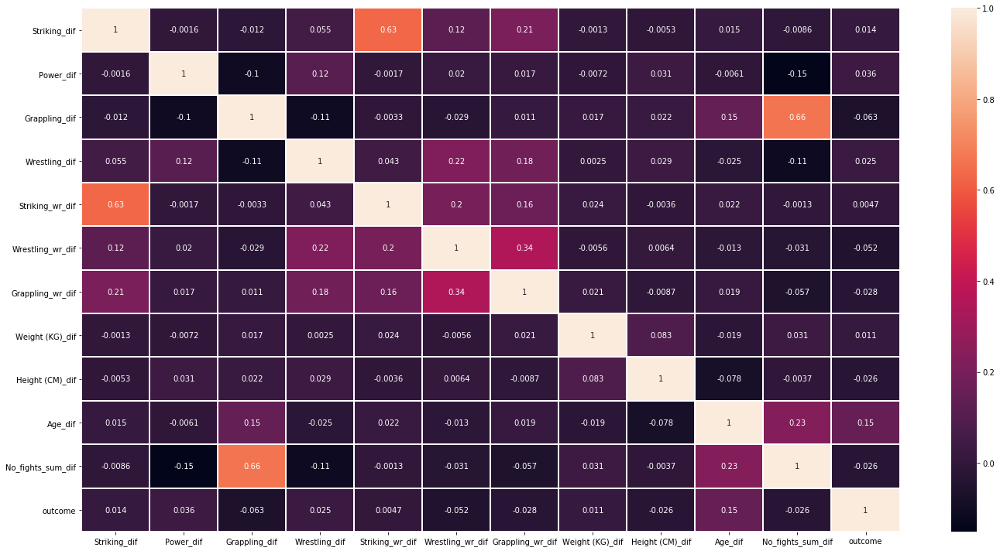

In [461]:
corr_plot(pred_df,4)

- condensed feature which now show engineered features based on **cumulative difference** in fighter stats 
- this is different to basic **individual infight** stats seen in section 1

### 4.1 Models and Feature Importance 
<a id="model"></a>

In [607]:
correlated = [
    "Striking_dif",
    "Power_dif",
    "Grappling_dif",
    "Wrestling_dif",
    "Striking_wr_dif",
    "Wrestling_wr_dif",
    "Grappling_wr_dif",
    "Weight (KG)_dif",
    "Height (CM)_dif",
    "Age_dif",
    "No_fights_sum_dif",
    "outcome",
]


def tt_split(mydataframe):
    #     train test split
    mydataframe = mydataframe[correlated]
    mydataframe = mydataframe.dropna()
    X = mydataframe.iloc[:, 0 : len(mydataframe.columns) - 1].values
    y = mydataframe["outcome"].values
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

    return X_train, X_test, y_train, y_test


def get_rf_report(X_train, X_test, y_train, y_test):
    # applys random forest
    rf_model = RandomForestClassifier(
        n_estimators=100, criterion="entropy", max_depth=3
    )
    rf_model.fit(X_train, y_train)
    rf_pred = rf_model.predict(X_test)

    print(classification_report(y_test, rf_pred))
    feature_importance = pd.DataFrame(
        rf_model.feature_importances_, index=correlated[:-1], columns=["importance"]
    ).sort_values("importance", ascending=False)
    feature_importance = feature_importance.reset_index()
    feature_importance.columns = ["attribute", "importance"]
    return feature_importance, rf_model, correlated


def get_logistic_report(X_train, X_test, y_train, y_test, alpha):
    # applys logistic regression

    if alpha == True:
        X_train = X_train[:, [2, 9]]
        X_test = X_test[:, [2, 9]]
        logit_model = sm.Logit(y_train, X_train)
        result = logit_model.fit()
        print(result.summary())
    if alpha == False:
        classifier = LogisticRegression(random_state=0)
        classifier.fit(X_train, y_train)
        y_pred = classifier.predict(X_test)
        print(classification_report(y_test, y_pred))

        logit_model = sm.Logit(y_train, X_train)
        result = logit_model.fit()
        print(result.summary())
        print(classifier.coef_)


def plot_rf_feature_importance(mydataframe):
    # plots RF significant features
    fig, ax = plt.subplots(figsize=(20, 10))
    plt.xticks(rotation="vertical")
    plt.title("Significant Features for Random Forest")
    sns.catplot(x="attribute", y="importance", data=mydataframe, kind="bar", ax=ax)
    plt.close(2)


def plot_rf_tree(mymodel):
    # plots a random tree from random forest model
    random_int = random.randint(1, 100)
    export_graphviz(
        mymodel[random_int],
        out_file="tree.dot",
        feature_names=correlated[:-1],
        class_names=["win", "lose"],
        rounded=True,
        proportion=False,
        precision=2,
        filled=True,
    )
    call(["dot", "-Tpng", "tree.dot", "-o", "tree.png", "-Gdpi=600"])

<IPython.core.display.Javascript object>

### 4.1 Modeling
<a id="model"></a>
- models applied to understand significance of engineered features 

In [464]:
X_train, X_test, y_train, y_test = tt_split(pred_df)

In [471]:
get_logistic_report(X_train, X_test, y_train, y_test,False)

              precision    recall  f1-score   support

           0       0.53      0.28      0.37       190
           1       0.62      0.83      0.71       272

    accuracy                           0.60       462
   macro avg       0.58      0.56      0.54       462
weighted avg       0.59      0.60      0.57       462

Optimization terminated successfully.
         Current function value: 0.672975
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                 1846
Model:                          Logit   Df Residuals:                     1835
Method:                           MLE   Df Model:                           10
Date:                Sat, 14 Dec 2019   Pseudo R-squ.:                 0.01217
Time:                        12:18:52   Log-Likelihood:                -1242.3
converged:                       True   LL-Null:                       -1257.6
Covariance Type:  

/Users/matthewgalloway/opt/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning:

Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.



- logistic regression with very poor R squared above (without backwards elimination)
- logistic regression with very poor R squared below and  backwards elimination (p values below 0.01) 
- abandoned as a model as a result

In [492]:
get_logistic_report(X_train, X_test, y_train, y_test,True)

Optimization terminated successfully.
         Current function value: 0.675381
         Iterations 4
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                 1846
Model:                          Logit   Df Residuals:                     1844
Method:                           MLE   Df Model:                            1
Date:                Sat, 14 Dec 2019   Pseudo R-squ.:                0.008638
Time:                        12:23:00   Log-Likelihood:                -1246.8
converged:                       True   LL-Null:                       -1257.6
Covariance Type:            nonrobust   LLR p-value:                 3.144e-06
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1            -0.0086      0.002     -3.674      0.000      -0.013      -0.004
x2             0.0711      0.

- random forest was applied to and single tree evaluated from the forest to attempt to understand relationships

In [496]:
feature_importance,rf_model,correlated = get_rf_report(X_train, X_test, y_train, y_test)

              precision    recall  f1-score   support

           0       0.73      0.13      0.22       190
           1       0.61      0.97      0.75       272

    accuracy                           0.62       462
   macro avg       0.67      0.55      0.48       462
weighted avg       0.66      0.62      0.53       462



### 4.2 Variable Importance
<a id="variable"></a>

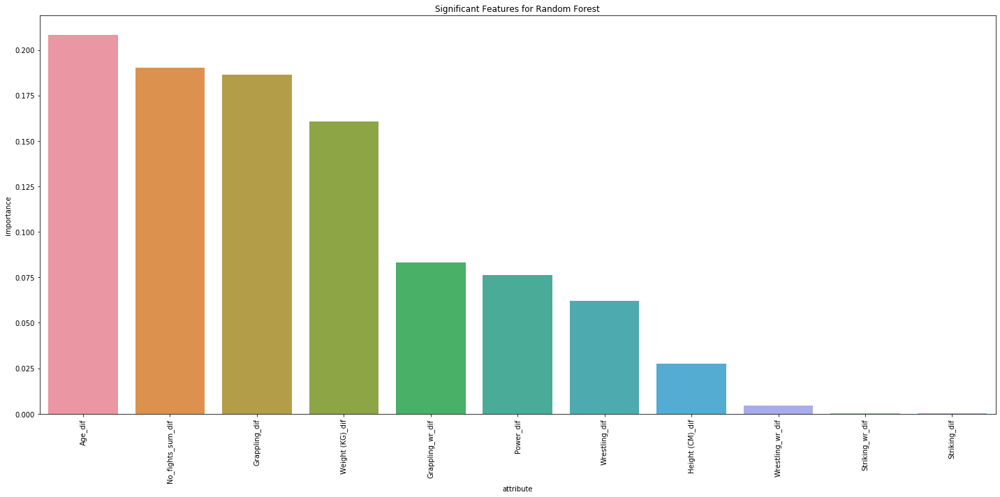

In [497]:
plot_rf_feature_importance(feature_importance)

- despite the hypothesis that skills would be a significant factor, simple age difference is most significant, see report for detailed analysis 

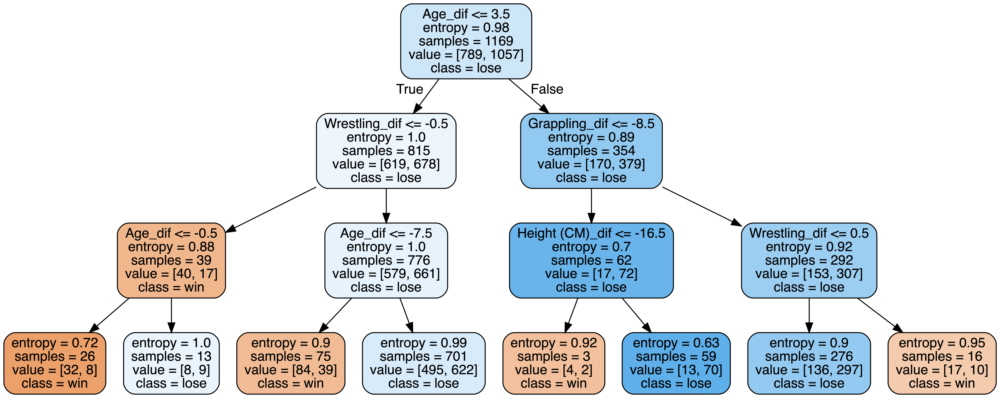

In [515]:
plot_rf_tree(rf_model)
Image( 'tree.png')

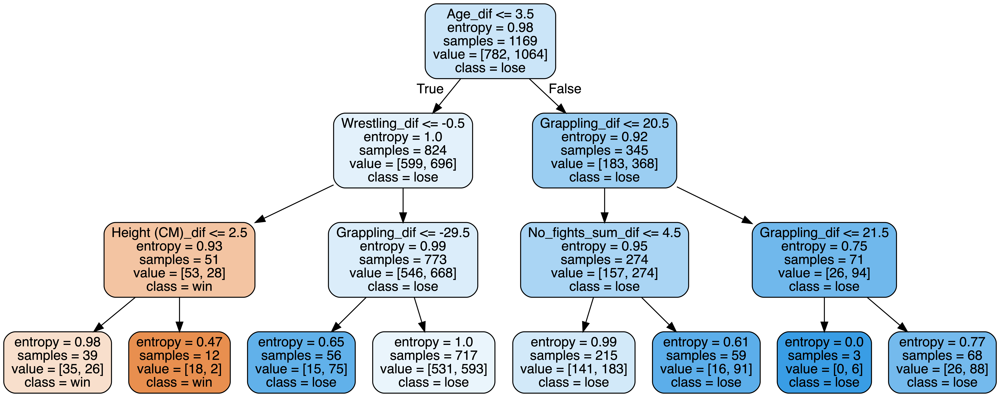

In [517]:
plot_rf_tree(rf_model)
Image( 'tree.png')

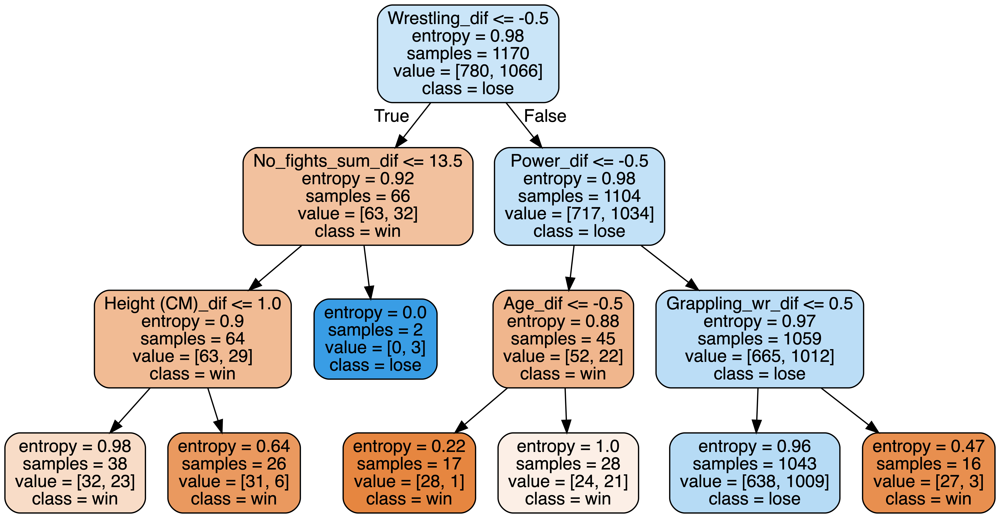

In [519]:
plot_rf_tree(rf_model)
Image( 'tree.png')

- random trees evaluated for decision boundaries for variables - discussed in report

### 5.0 Apendix
<a id="Apendix"></a>

### 5.1 Web Scraper
<a id="Apendix"></a>

In [1429]:
"""
Web scraper adapted from  https://github.com/paddycarey/sherdog-fighter-scraper/blob/master/scraper.py
Only minor changes were made to make it python 3 compatable and update some of the HTML locations for the website

    A simple scraper to retrieve data from sherdog.py
    in a predictable/easily machine readable format
    Copyright (c) 2012, Patrick Carey
    Permission to use, copy, modify, and/or distribute this software for any
    purpose with or without fee is hereby granted, provided that the above
    copyright notice and this permission notice appear in all copies.
    THE SOFTWARE IS PROVIDED "AS IS" AND THE AUTHOR DISCLAIMS ALL WARRANTIES
    WITH REGARD TO THIS SOFTWARE INCLUDING ALL IMPLIED WARRANTIES OF
    MERCHANTABILITY AND FITNESS. IN NO EVENT SHALL THE AUTHOR BE LIABLE FOR
    ANY SPECIAL, DIRECT, INDIRECT, OR CONSEQUENTIAL DAMAGES OR ANY DAMAGES
    WHATSOEVER RESULTING FROM LOSS OF USE, DATA OR PROFITS, WHETHER IN AN
    ACTION OF CONTRACT, NEGLIGENCE OR OTHER TORTIOUS ACTION, ARISING OUT OF OR
    IN CONNECTION WITH THE USE OR PERFORMANCE OF THIS SOFTWARE.
"""

session = HTMLSession()

class Scraper(object):

    """A collection of functions which can be used to retrieve and parse fight related data from sherdog.com"""

    # Base URL for all requests
    base_url = 'http://www.sherdog.com'

    @classmethod
    def isNone(self, x):

        """Simple check if an object is None for use in building list comprehensions"""

        if x is not None:
            return False
        else:
            return True

    @classmethod
    def scrape_fighter(self, fighter_id):

        """Retrieve and parse a fighter's details from sherdog.com"""

        # make sure fighter_id is an int
        fighter_id = str(fighter_id)

        # fetch the required url and parse it
        response = session.get('http://www.sherdog.com'+'/fighter/'+fighter_id)
        soup = BeautifulSoup(response.content, 'html.parser')
#         url_content = self.fetch_url('%s/fighter/x-%s' % (self.base_url, fighter_id))
#         soup = BeautifulSoup(url_content)

        # get the fighter's name
        name =  soup.find('span', {'class': 'fn'}).contents[0]

        # get the fighter's birth date
        try:
            birth_date = soup.find('span', {'itemprop': 'birthDate'}).contents[0]

        except AttributeError:
            birth_date = None
        else:
            if birth_date == 'N/A':
                birth_date = None
            else:
                birth_date = datetime.datetime.strptime(birth_date, '%Y-%m-%d')
                birth_date = birth_date.isoformat()
        # get the fighter's locality
        try:
            locality = soup.find('span', {'itemprop': 'addressLocality'}).contents[0]
        except AttributeError:
            locality = None

        # get the fighter's locality
        try:
            nationality = soup.find('strong', {'itemprop': 'nationality'}).contents[0]
        except AttributeError:
            nationality = None

        # get the fighter's height in CM
        try:
            height_cm = soup.find('span', {'class': 'item height'}).contents[-1].lstrip().rstrip().replace(' cm', '')
        except AttributeError:
            height_cm = None

        # get the fighter's weight in KG
        try:
            weight_kg = soup.find('span', {'class': 'item weight'}).contents[-1].lstrip().rstrip().replace(' kg', '')
        except AttributeError:
            weight_kg = None

        # get the fighter's camp/team
        try:
            camp_team = soup.find('h5', {'class': 'item association'}).strong.span.a.span.contents[0]
        except AttributeError:
            camp_team = None

        wld = {}
        wld['wins'] = 0
        wld['losses'] = 0
        wld['draws'] = 0
        wlds = soup.findAll('span', {'class': 'result'})
        for x in wlds:
            wld[x.contents[0].lower()] = x.findNextSibling('span').contents[0]

        last_fight = soup.find('span', {'class': 'sub_line'}).contents[0]
        last_fight = datetime.datetime.strptime(last_fight, '%b / %d / %Y')
        last_fight = last_fight.isoformat()

        # build a dict with the scraped data and return it
        result = {
            'name': name,
            'birth_date': birth_date,
            'locality': locality,
            'nationality': nationality,
            'height_cm': height_cm,
            'weight_kg': weight_kg,
            'camp_team': camp_team,
            'id': fighter_id,
            'wins': wld['wins'],
            'losses': wld['losses'],
            'draws': wld['draws'],
            'last_fight': last_fight,
        }
        return result
    
class UnicodeWriter:
    """
    A CSV writer which will write rows to CSV file "f",
    which is encoded in the given encoding.
    """

    def __init__(self, f, dialect=csv.excel, encoding="utf-8", **kwds):
        # Redirect output to a queue
        self.queue =StringIO()
        self.writer = csv.writer(self.queue, dialect=dialect, **kwds)
        self.stream = f
        self.encoder = codecs.getincrementalencoder(encoding)()

    def writerow(self, row):
        try:
            self.writer.writerow([s.encode("utf-8") for s in row])
        except UnicodeDecodeError:
            self.writer.writerow(row)
        # Fetch UTF-8 output from the queue ...
        data = self.queue.getvalue()
        # ... and reencode it into the target encoding
        data = self.encoder.encode(data)
        # write to the target stream
        self.stream.write(data)
        # empty queue
        self.queue.truncate(0)

    def writerows(self, rows):
        for row in rows:
            self.writerow(row)